# Introduction to High-Performance Scientific Computing with PyOpenCL

In [19]:
!pip2 freeze | grep "numpy\|pyopencl\|matplotlib"

You are using pip version 8.1.1, however version 8.1.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
gnumpy==0.2
matplotlib==1.5.1
numpy==1.11.0
pyopencl==2015.2.4


## What is Parallel Programming?

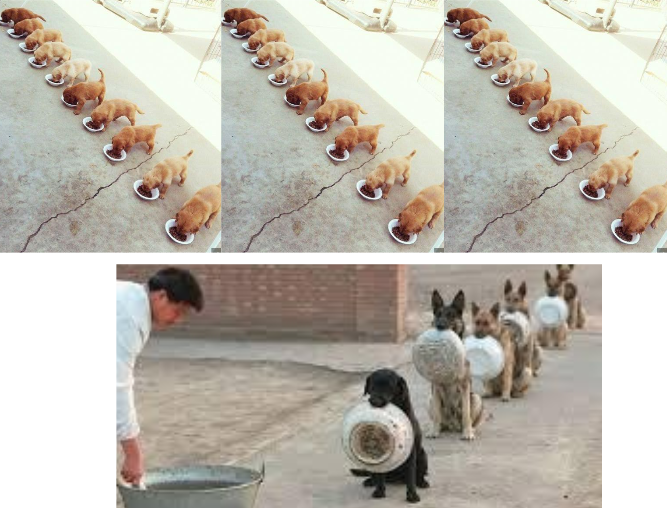

In [1]:
from IPython.display import Image
Image(filename='images/parallel.png', width=400)

In [ ]:
https://github.com/celiacintas/scipyla2016_tutorials/blob/master/pyopencl_intro/GPGPU%20con%20PyOpenCL.ipynb

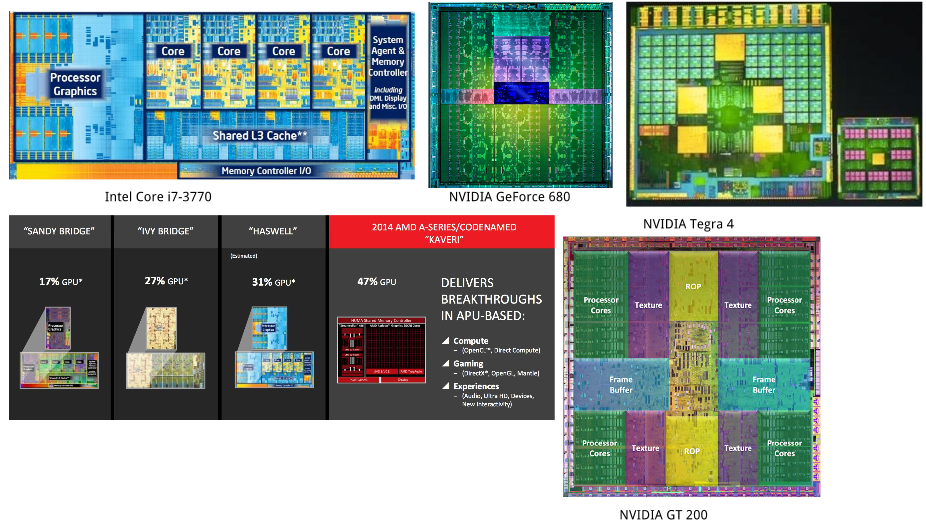

In [2]:
from IPython.display import Image
Image(filename='images/diversity.png', width=600)

## What is OpenCL? 

OpenCL (Open Computing Language) is an
open, royalty-free standard for general purpose
parallel programming across CPUs, GPUs and
other processors.

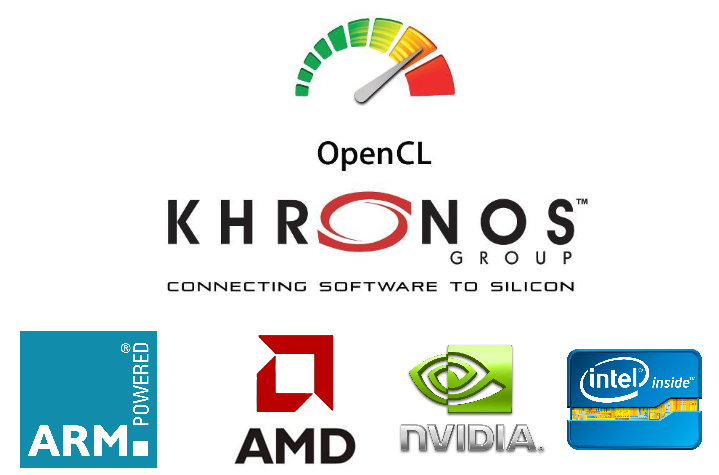

In [3]:
from IPython.display import Image
Image(filename='images/khronos.png', width=500)

Defines:
- Host-side programming interface
    - Abstraction layer for Hardware
    - Query, selection and configuration of OpenCL devices
    - Context creation
    - Creation and management of memory resources
    - Program execution
    
- Device-side programming language
    - OpenCL C: based on C99

### Abstract Architecture (Platform Model)

Specifies the processor coordinating execution (the host) and one or more processors capable of executing OpenCL C code (the devices).


Images from http://mathema.tician.de/software/pyopencl/


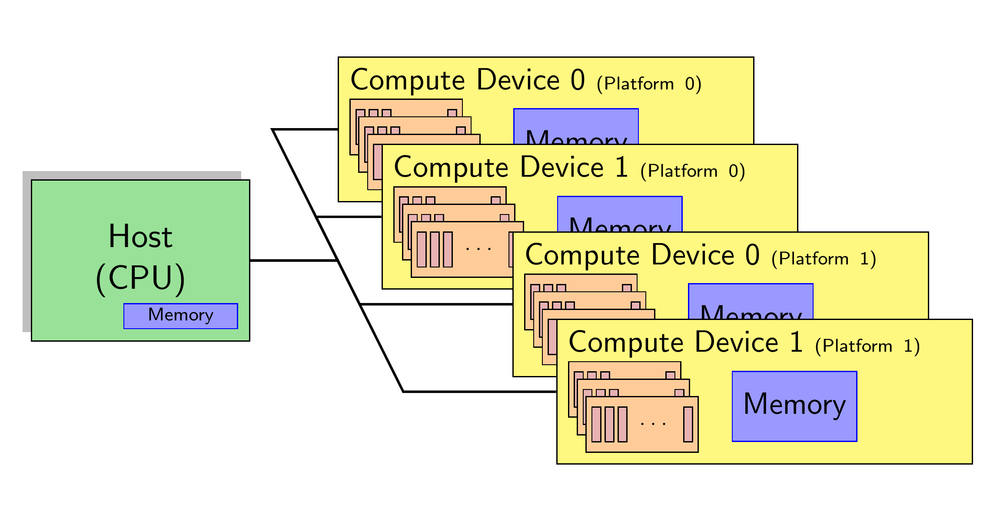

In [4]:
from IPython.display import Image
print "Images from http://mathema.tician.de/software/pyopencl/"
Image(filename='images/schema.png', width=500)


### Execution Model
Defines how the OpenCL environment is configured on the host and how kernels are executed on the device. This includes setting up an OpenCL context on the host, providing mechanisms for host–device interaction.

imagenes de Heterogeneous Computing with OpenCL


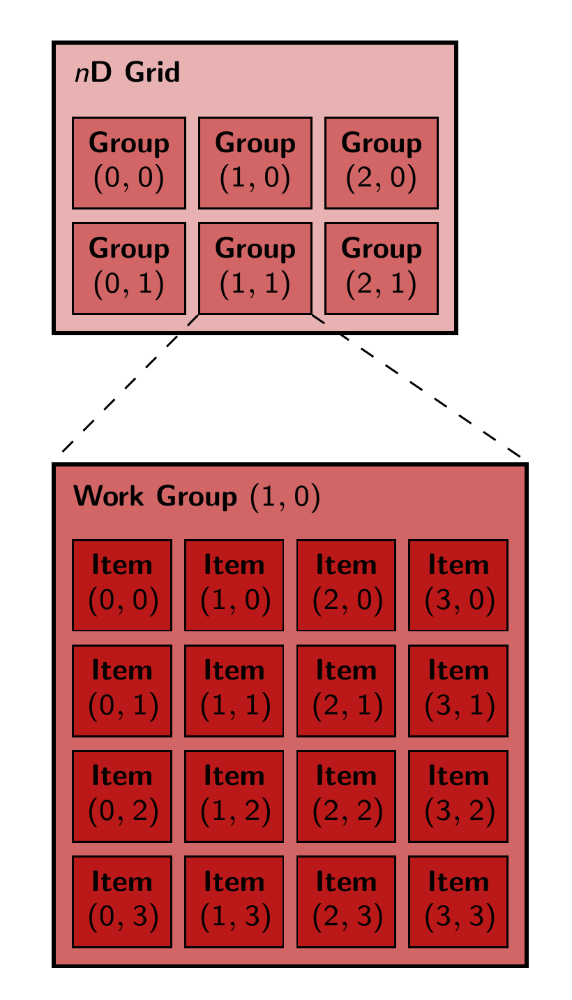

In [6]:
from IPython.display import Image
print "imagenes de Heterogeneous Computing with OpenCL"
Image(filename='images/exe_map.png', width=300)

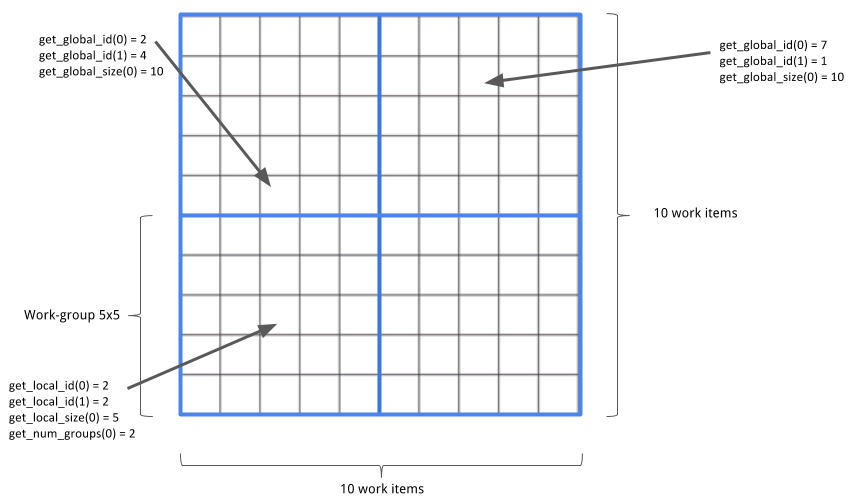

In [7]:
from IPython.display import Image
Image(filename='images/exe_pos.png', width=600)

Let's say that we have 10\*10 work-items (10 in each dimension), this is 100 work items (**WI**), **GSZ** (Global size).

And we have workgroups (blue lines) 5\*5 work-items per work-group, 25 work-items(**WG**), **LSZ** (Local size).

This results in 10/5 = 2 work-groups in dimension 0 and 10/5 = 2 work-groups in dimension 1. for a total of 4 work-groups (**WG**).
All these positions and sizes can be obtained with OpenCL.. 
- `get_global_id(dim)` == The ID of the current work-item [0,**WI**) in dimension dim.
- `get_global_size(dim)` == The total number of work-items (**WI**) in dimension dim.
- `get_group_id(dim)` == The ID of the current work-group [0, **WG**) in dimension dim.
- `get_local_id(dim)` == The ID of the work-item within the work-group [0, **WI/WG**) in dimension dim.
- `get_local_size(dim)` == The number of work-items per work-group = **WI/WG** in dimension dim.

### Memory Types
Defines the abstract memory hierarchy that kernels use, regardless of the actual underlying memory architecture.


- **Global memory** is visible to all compute units on the device. Whenever data is transferred from the host to the device, the data will reside in global memory. Any data that is to be transferred back from the device to the host must also reside in global memory. The keyword **__global**.

- **Constant memory** is not specifically designed for every type of read-only data but, rather, for data where each element is accessed simultaneously by all work-items. Variables whose values never change (e.g., a data variable holding the value of pi) also fall into this category. Data is mapped to constant memory by using the keyword **__constant**.

- **Local memory ** is a memory whose address space is unique to each compute device. It is common for it to be implemented as on-chip memory, but there is no requirement that this be the case. Local memory is modeled as being shared by a workgroup. As such, accesses may have much shorter latency and much higher bandwidth than global memory. The keyword is **__local**.
- **Private memory** is memory that is unique to an individual work-item. 

images from Heterogeneous Computing with OpenCL


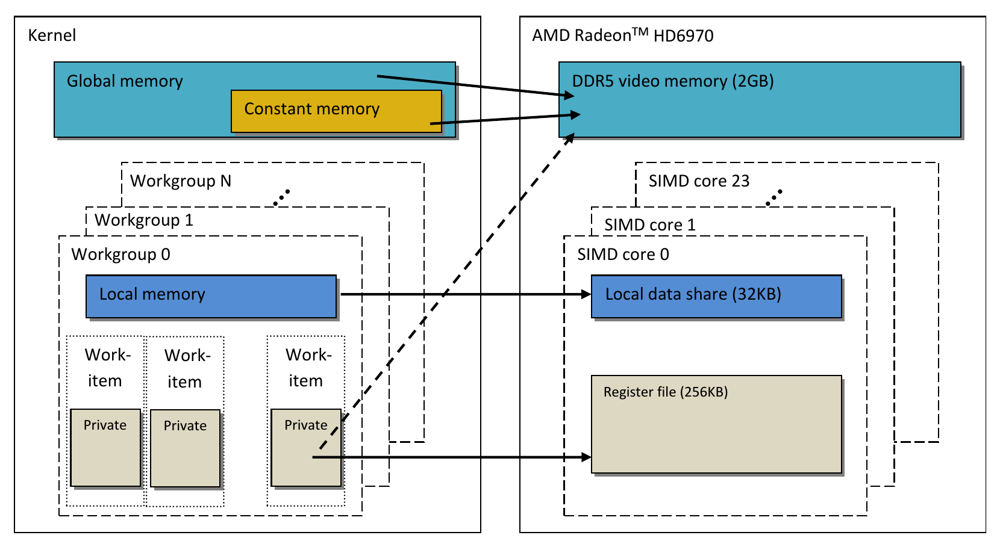

In [8]:
from IPython.display import Image
print "images from Heterogeneous Computing with OpenCL"
Image(filename='images/memory_map.png', width=600)

###  Synchronization in OpenCL
- Barrier, A call to barrier within a work item requires that that work item cannot continue past the barrier until all work items in the group have also reached the barrier.
- Events, in a queue, a finish() command blocks until an entire queue complete execution. Waiting on the completion of a specific event.
- Fences, `read_mem_fence(cl_mem_fence_flags)`, `write_mem_fence(cl_mem_fence_flags)`, `mem_fence(cl_mem_fence_flags)`



images from Heterogeneous Computing with OpenCL


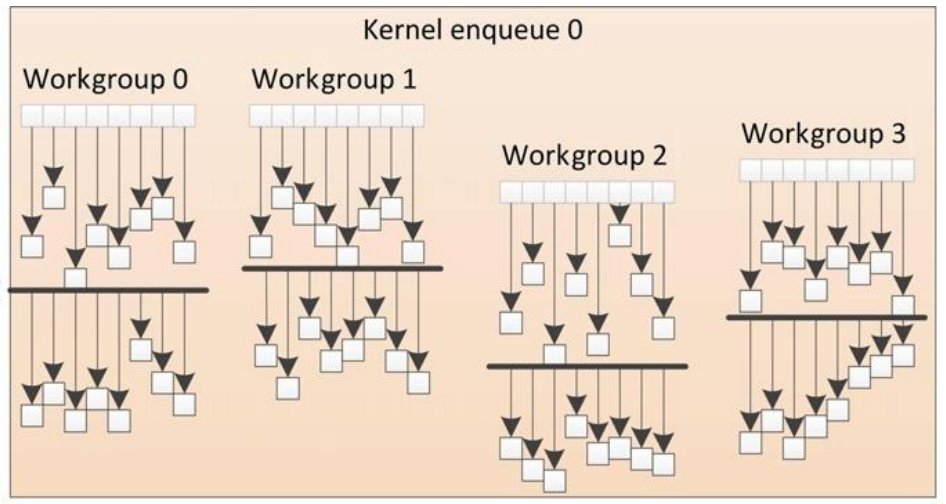

In [9]:
from IPython.display import Image
print "images from Heterogeneous Computing with OpenCL"
Image(filename='images/barrier.png', width=600)

### Why all this trouble?

images from Heterogeneous Computing with OpenCL


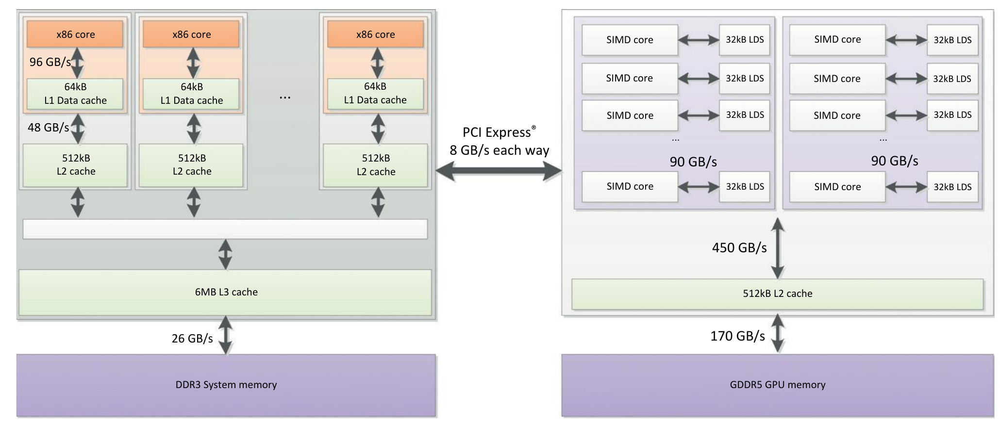

In [10]:
from IPython.display import Image
print "images from Heterogeneous Computing with OpenCL"
Image(filename='images/memory_band.png', width=600) 

### How to install OpenCL ¿?
- Archlinux: you can find all the packages with yaourt (you have to reboot the system), (opencl-mesa, intel-opencl-runtime intel-opencl-sdk, opencl-nvidia)
- Ubuntu:
    - sudo apt-get install opencl-headers
    - sudo apt-get install beignet beignet-dev beignet-opencl-icd (for intel processors)
    - sudo apt-get install nvidia-opencl-dev
    - [OpenCL for AMD](http://developer.amd.com/tools-and-sdks/opencl-zone/amd-accelerated-parallel-processing-app-sdk/)

### How to install PyOpenCL ¿?

- Via **pip** `$pip install pyopencl`

- Via **anaconda** `$conda install -c derickl pyopencl=2015.1`

### Why PyOpenCL ¿?
- Automatic Cleanup
- Provide complete access
- Automatically manage resources
- Provide abstractions
- Integrate tightly with numpy
- PyOpenCL supports every OS that has an OpenCL implementation.
- Great Documentation! https://documen.tician.de/pyopencl/


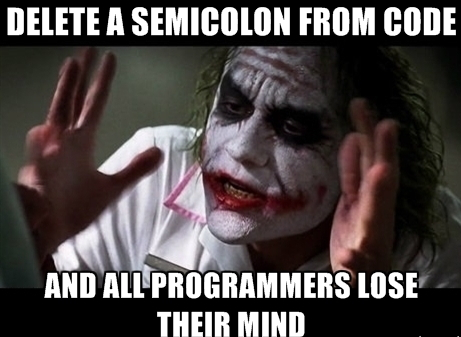

In [11]:
from IPython.display import Image
Image(filename='images/semicolon.jpg', width=400)

##### Compare c++ host code vs python !! (Go to sublime now ..)

## Numpy Basics

In [20]:
import numpy as np

In [21]:
np.zeros((6,6), dtype=np.float16)

array([[ 0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.]], dtype=float16)

In [22]:
a = np.array(range(64), dtype=np.int32)
a

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63], dtype=int32)

In [23]:
a = a.reshape((8, 8))
a

array([[ 0,  1,  2,  3,  4,  5,  6,  7],
       [ 8,  9, 10, 11, 12, 13, 14, 15],
       [16, 17, 18, 19, 20, 21, 22, 23],
       [24, 25, 26, 27, 28, 29, 30, 31],
       [32, 33, 34, 35, 36, 37, 38, 39],
       [40, 41, 42, 43, 44, 45, 46, 47],
       [48, 49, 50, 51, 52, 53, 54, 55],
       [56, 57, 58, 59, 60, 61, 62, 63]], dtype=int32)

In [24]:
b = np.empty_like(a)
b

array([[0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0]], dtype=int32)

In [25]:
np.random.rand(5, 5)

array([[ 0.31592074,  0.23661106,  0.15182174,  0.36988133,  0.69707387],
       [ 0.82962218,  0.94996267,  0.28437928,  0.82220931,  0.81589361],
       [ 0.07596659,  0.78324071,  0.24714847,  0.41667171,  0.74646167],
       [ 0.94637494,  0.85633569,  0.63450961,  0.55135124,  0.85941685],
       [ 0.58339326,  0.15687047,  0.78942421,  0.21379065,  0.37748933]])

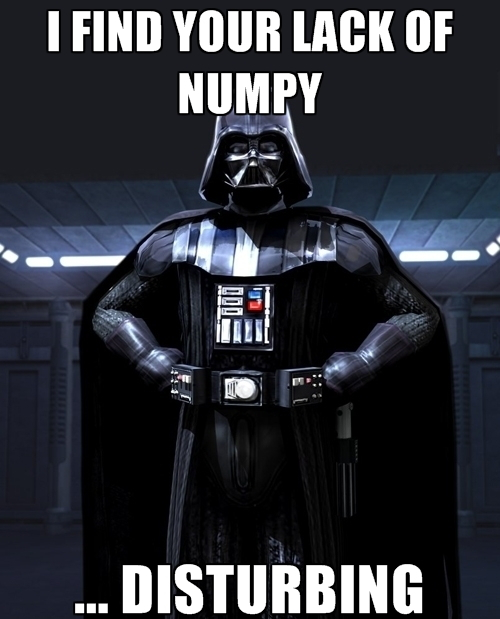

In [26]:
from IPython.display import Image
Image(filename='images/numpy.jpg', width=300)

## Starting with PyOpenCL

In [27]:
import pyopencl as cl
import numpy as np
import matplotlib.pyplot as plt

#### Getting information about our platform and hardware capabilities.

In [28]:
cl.get_cl_header_version()

(2, 0)

#### What Platform are we using?

In [30]:
platforms = cl.get_platforms()
platforms

[<pyopencl.Platform 'NVIDIA CUDA' at 0x5632833da690>]

In [31]:
d = platforms[0].get_devices(cl.device_type.ALL)[0]

In [32]:
print "Name:", d.name
print "Version:", d.opencl_c_version
print "Local Memory Size:", d.local_mem_size/1024, "KB"
print "Global Memory Size:", d.global_mem_size/(1024*1024), "MB"
print "Max Alloc Size:", d.max_mem_alloc_size/(1024*1024), "MB"
print "Max Work-group Total Size:", d.max_work_group_size

Name: GeForce GTX 860M
Version: OpenCL C 1.2 
Local Memory Size: 48 KB
Global Memory Size: 2047 MB
Max Alloc Size: 511 MB
Max Work-group Total Size: 1024


#### Which formats are supported?

In [33]:
flags = cl.mem_flags.READ_ONLY 
image_type = cl.mem_object_type.IMAGE2D

In [34]:
cl.get_supported_image_formats(cl.Context(devices=[d]), flags, image_type=image_type)

[ImageFormat(R, FLOAT),
 ImageFormat(R, HALF_FLOAT),
 ImageFormat(R, UNORM_INT8),
 ImageFormat(R, UNORM_INT16),
 ImageFormat(R, SNORM_INT16),
 ImageFormat(R, SIGNED_INT8),
 ImageFormat(R, SIGNED_INT16),
 ImageFormat(R, SIGNED_INT32),
 ImageFormat(R, UNSIGNED_INT8),
 ImageFormat(R, UNSIGNED_INT16),
 ImageFormat(R, UNSIGNED_INT32),
 ImageFormat(A, FLOAT),
 ImageFormat(A, HALF_FLOAT),
 ImageFormat(A, UNORM_INT8),
 ImageFormat(A, UNORM_INT16),
 ImageFormat(A, SNORM_INT16),
 ImageFormat(A, SIGNED_INT8),
 ImageFormat(A, SIGNED_INT16),
 ImageFormat(A, SIGNED_INT32),
 ImageFormat(A, UNSIGNED_INT8),
 ImageFormat(A, UNSIGNED_INT16),
 ImageFormat(A, UNSIGNED_INT32),
 ImageFormat(RG, FLOAT),
 ImageFormat(RG, HALF_FLOAT),
 ImageFormat(RG, UNORM_INT8),
 ImageFormat(RG, UNORM_INT16),
 ImageFormat(RG, SNORM_INT16),
 ImageFormat(RG, SIGNED_INT8),
 ImageFormat(RG, SIGNED_INT16),
 ImageFormat(RG, SIGNED_INT32),
 ImageFormat(RG, UNSIGNED_INT8),
 ImageFormat(RG, UNSIGNED_INT16),
 ImageFormat(RG, UNSIGNED_I

### Context and Queue

A context is an abstract container that exists on the host. A context
coordinates the mechanisms for host–device interaction, manages the memory objects that are available to the devices, and keeps track of the programs and kernels
that are created for each device.


#### Several ways to create context

In [35]:
ctx = cl.create_some_context(interactive=True) #Try interactive

Choose platform:
[0] <pyopencl.Platform 'NVIDIA CUDA' at 0x5632833da690>
Choice [0]:0
Set the environment variable PYOPENCL_CTX='0' to avoid being asked again.


In [36]:
!ls /etc/OpenCL/vendors/

nvidia.icd


In [37]:
ctx = cl.Context(devices=[d])

The command queue is the mechanism that the host uses to request action by the device. Once the host decides which devices to work with and a context is created, one command queue needs to be created per device (i.e., each command queue is associated with only one device). Whenever the host needs an action to be performed by a device, it will submit commands to the proper command queue.

imagenes de http://mathema.tician.de/software/pyopencl/


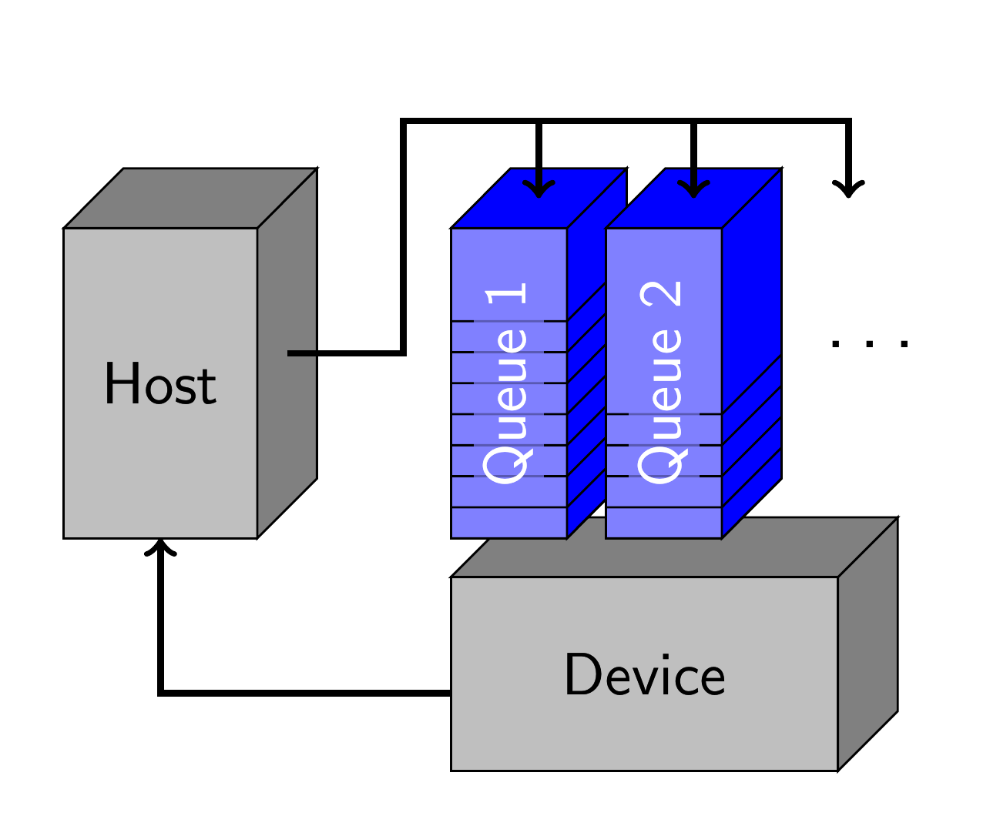

In [13]:
from IPython.display import Image
print "imagenes de http://mathema.tician.de/software/pyopencl/"
Image(filename='images/queue.png', width=300) 

In [38]:
queue = cl.CommandQueue(ctx)

### Events

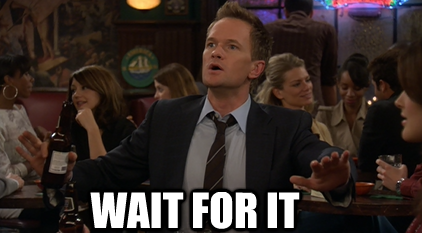

In [14]:
from IPython.display import Image
Image(filename='images/wait.png', width=400) 

Events have two main roles in OpenCL:
- Representing dependencies (`event.wait()`, `enqueue_XXX(queue, ..., wait_for=[evt1, evt2]`)
- Providing a mechanism for profiling


### Memory Objects

In order for data to be transferred to a device, it must first be encapsulated as a memory object.
OpenCL defines two types of memory objects: buffers and images.
Buffers are arrays, where data elements are stored contiguously in memory. Images, on the other hand, are designed as opaque objects, allowing for data padding and other optimizations that may improve performance on devices.


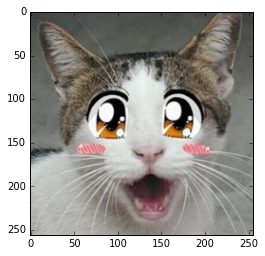

In [39]:
%matplotlib inline
from PIL import Image

im = Image.open('images/cat.jpg').convert('RGBA')
im = np.array(list(im.getdata())).astype(np.uint8).reshape((256, 256, 4))
plt.imshow(im)

In [41]:
cl_img_format = cl.ImageFormat(cl.channel_order.RGBA, cl.channel_type.UNORM_INT8)

mf = cl.mem_flags
img_input  = cl.Image(ctx, mf.READ_ONLY | mf.COPY_HOST_PTR, cl_img_format, (im.shape[0], im.shape[1]), hostbuf=im)

In [42]:
img_input.release()

In [43]:
mf = cl.mem_flags

my_matrix = np.random.rand(1024000).astype(np.float32)
my_matrix_result = np.empty_like(my_matrix)

my_matrix_buf = cl.Buffer(ctx, mf.READ_ONLY | mf.COPY_HOST_PTR, hostbuf=my_matrix)
my_result_buf = cl.Buffer(ctx, mf.WRITE_ONLY, my_matrix_result.nbytes)


In [44]:
print type(my_matrix_buf)
print my_matrix, my_matrix.shape

<class 'pyopencl.cffi_cl.Buffer'>
[ 0.47069603  0.95730948  0.81262243 ...,  0.11092284  0.15963112
  0.37575349] (1024000,)


### Program Objects

A program is a collection of functions called kernels, where kernels are units of execution that can be scheduled to run on a device.

In [51]:
c_code = """
        __kernel void dob(__global const float *a,
        __global float *c)
        {
          int gid = get_global_id(0);
          c[gid] = a[gid] + a[gid];
        }
        """

In [47]:
my_matrix_result

array([ -1.65924070e-36,   3.09210519e-41,   1.57770051e-24, ...,
         1.81864142e+00,  -3.47779727e-30,   1.83069623e+00], dtype=float32)

In [52]:
program = cl.Program(ctx, c_code).build()

In [54]:
run = program.dob(queue, my_matrix_result.shape, None, my_matrix_buf, my_result_buf)

In [56]:
cl.enqueue_copy(queue, my_matrix_result, my_result_buf)

In [57]:
for local_work_size in [(16,), (1,), None]:
    %timeit program.dob(queue, my_matrix_result.shape, local_work_size, my_matrix_buf, my_result_buf)
    #program_name>.<kernel_name>( <command_queue>, <Global_work_size>,
    #       <Local_work_size>, <Parameters_to_kernel.....> )
    cl.enqueue_copy(queue, my_matrix_result, my_result_buf)
    my_matrix_result

1000 loops, best of 3: 1.04 ms per loop
1000 loops, best of 3: 7.24 ms per loop
1000 loops, best of 3: 1.04 ms per loop


In [58]:
assert((my_matrix + my_matrix)  == my_matrix_result).all()

In [59]:
my_result_buf.release(), my_matrix_buf.release()

(None, None)

## Programmings steps to write a OpenCL Application

images from Heterogeneous Computing with OpenCL


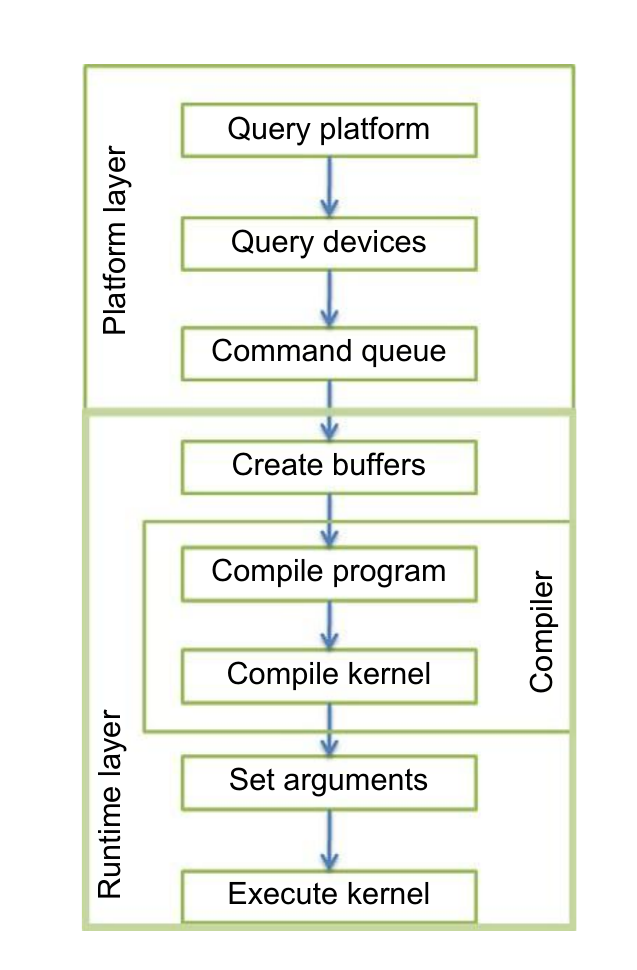

In [15]:
from IPython.display import Image
print "images from Heterogeneous Computing with OpenCL"
Image(filename='images/pipeline.png', width=300) 

### Matrix Operations
#### Matrix multiplication example

images from Heterogeneous Computing with OpenCL


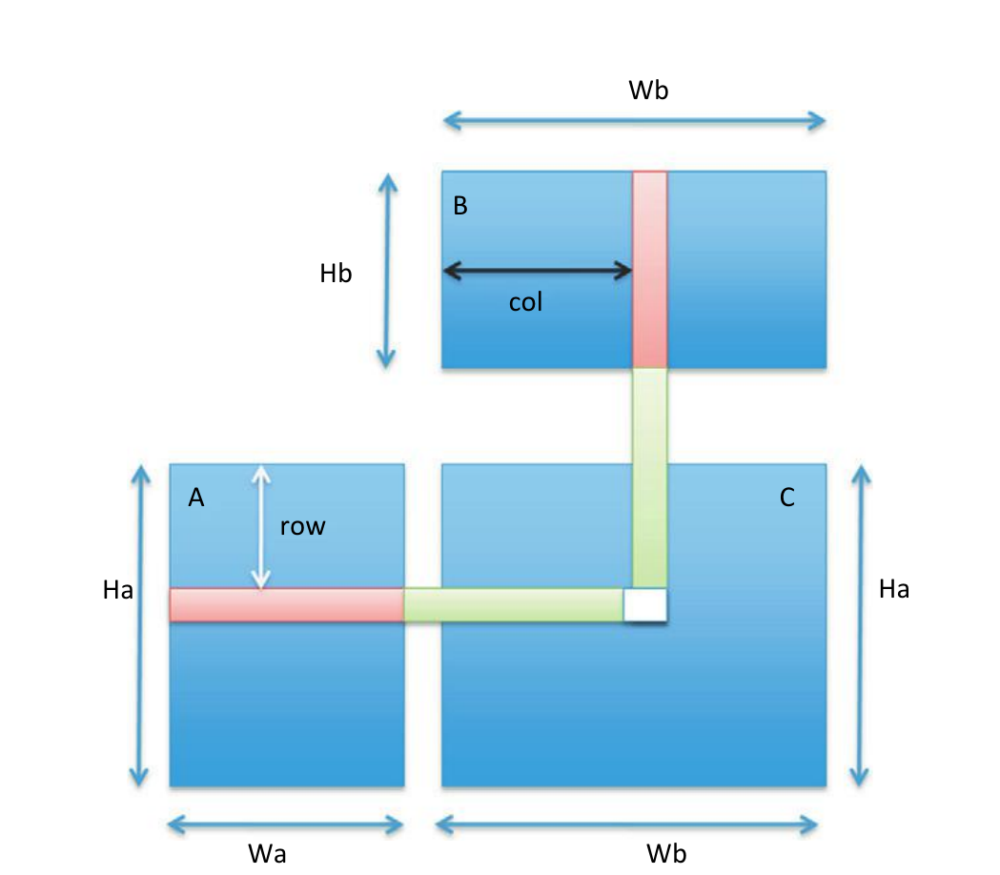

In [16]:
from IPython.display import Image
print "images from Heterogeneous Computing with OpenCL"
Image(filename='images/mult.png', width=400) 

##### Create context and queue

In [60]:
ctx = cl.create_some_context()
queue = cl.CommandQueue(ctx)

##### Create buffers

In [61]:
mf = cl.mem_flags

matrix_A = np.arange(256).astype(np.float32).reshape(16, 16)
matrix_B = np.arange(256).astype(np.float32).reshape(16, 16)
matrix_C = np.zeros_like(matrix_A)
W_a, H_a = np.int32(matrix_A.shape[0]), np.int32(matrix_A.shape[1])
W_b, H_b = np.int32(matrix_B.shape[0]), np.int32(matrix_B.shape[1])

matrix_A_buf = cl.Buffer(ctx, mf.READ_ONLY | mf.COPY_HOST_PTR, hostbuf=matrix_A)
matrix_B_buf = cl.Buffer(ctx, mf.READ_ONLY | mf.COPY_HOST_PTR, hostbuf=matrix_B)
matrix_C_buf = cl.Buffer(ctx, mf.WRITE_ONLY, matrix_C.nbytes)

##### Create and build kernel

In [62]:
mult_kernel = """ 
             __kernel void simple_multiply(__global float* output_C,
                                           int width_a,
                                           int height_a,
                                           int width_b,
                                           int height_b,
                                           __global float* input_A,
                                           __global float* input_B)
            {

            int2 coord = (int2) (get_global_id(0), get_global_id(1));
            float sum = 0.0f;
            //Calculate result of one element of Matrix C
            for (int i=0; i < width_a; i++) {
                sum += input_A[coord.x*width_a+i] * input_B[i*width_b+coord.y];
            }
            output_C[coord.x*width_b+coord.y] = sum;
            }
            """

In [63]:
program = cl.Program(ctx, mult_kernel).build()

##### Run the program and get the results

In [64]:
run = program.simple_multiply(queue, matrix_C.shape, None, matrix_C_buf, W_a, H_a, W_b, H_b, matrix_A_buf, matrix_B_buf).wait()
#program_name>.<kernel_name>( <command_queue>, <Global_work_size>,
#       <Local_work_size>, <Parameters_to_kernel.....> )
cl.enqueue_copy(queue, matrix_C, matrix_C_buf).wait()

In [65]:
assert((matrix_C  == (np.dot(matrix_A, matrix_B)))).all()
matrix_C

array([[  19840.,   19960.,   20080.,   20200.,   20320.,   20440.,
          20560.,   20680.,   20800.,   20920.,   21040.,   21160.,
          21280.,   21400.,   21520.,   21640.],
       [  50560.,   50936.,   51312.,   51688.,   52064.,   52440.,
          52816.,   53192.,   53568.,   53944.,   54320.,   54696.,
          55072.,   55448.,   55824.,   56200.],
       [  81280.,   81912.,   82544.,   83176.,   83808.,   84440.,
          85072.,   85704.,   86336.,   86968.,   87600.,   88232.,
          88864.,   89496.,   90128.,   90760.],
       [ 112000.,  112888.,  113776.,  114664.,  115552.,  116440.,
         117328.,  118216.,  119104.,  119992.,  120880.,  121768.,
         122656.,  123544.,  124432.,  125320.],
       [ 142720.,  143864.,  145008.,  146152.,  147296.,  148440.,
         149584.,  150728.,  151872.,  153016.,  154160.,  155304.,
         156448.,  157592.,  158736.,  159880.],
       [ 173440.,  174840.,  176240.,  177640.,  179040.,  180440.,
       

#### Transpose

In [66]:
transpose_kernel = """ 
             __kernel void simple_transpose(__global float* outputTranspose,
                                      __global float* inputA,
                                      int w_a,
                                      int h_a)
            {

            int2 coord = (int2) (get_global_id(0), get_global_id(1));
            int read_idx = coord.x + coord.y * w_a; 
            int write_idx = coord.y + coord.x * h_a;
            outputTranspose[write_idx] = inputA[read_idx];
            }
            """

In [67]:
program = cl.Program(ctx, transpose_kernel).build()

In [68]:
run = program.simple_transpose(queue, matrix_C.shape, None, matrix_C_buf, matrix_A_buf, W_a, H_a).wait()
#program_name>.<kernel_name>( <command_queue>, <Global_work_size>,
#       <Local_work_size>, <Parameters_to_kernel.....> )
cl.enqueue_copy(queue, matrix_C, matrix_C_buf).wait()

In [69]:
matrix_C

array([[   0.,   16.,   32.,   48.,   64.,   80.,   96.,  112.,  128.,
         144.,  160.,  176.,  192.,  208.,  224.,  240.],
       [   1.,   17.,   33.,   49.,   65.,   81.,   97.,  113.,  129.,
         145.,  161.,  177.,  193.,  209.,  225.,  241.],
       [   2.,   18.,   34.,   50.,   66.,   82.,   98.,  114.,  130.,
         146.,  162.,  178.,  194.,  210.,  226.,  242.],
       [   3.,   19.,   35.,   51.,   67.,   83.,   99.,  115.,  131.,
         147.,  163.,  179.,  195.,  211.,  227.,  243.],
       [   4.,   20.,   36.,   52.,   68.,   84.,  100.,  116.,  132.,
         148.,  164.,  180.,  196.,  212.,  228.,  244.],
       [   5.,   21.,   37.,   53.,   69.,   85.,  101.,  117.,  133.,
         149.,  165.,  181.,  197.,  213.,  229.,  245.],
       [   6.,   22.,   38.,   54.,   70.,   86.,  102.,  118.,  134.,
         150.,  166.,  182.,  198.,  214.,  230.,  246.],
       [   7.,   23.,   39.,   55.,   71.,   87.,  103.,  119.,  135.,
         151.,  167.,  183

### Image Operations

#### Rotation

images from Heterogeneous Computing with OpenCL


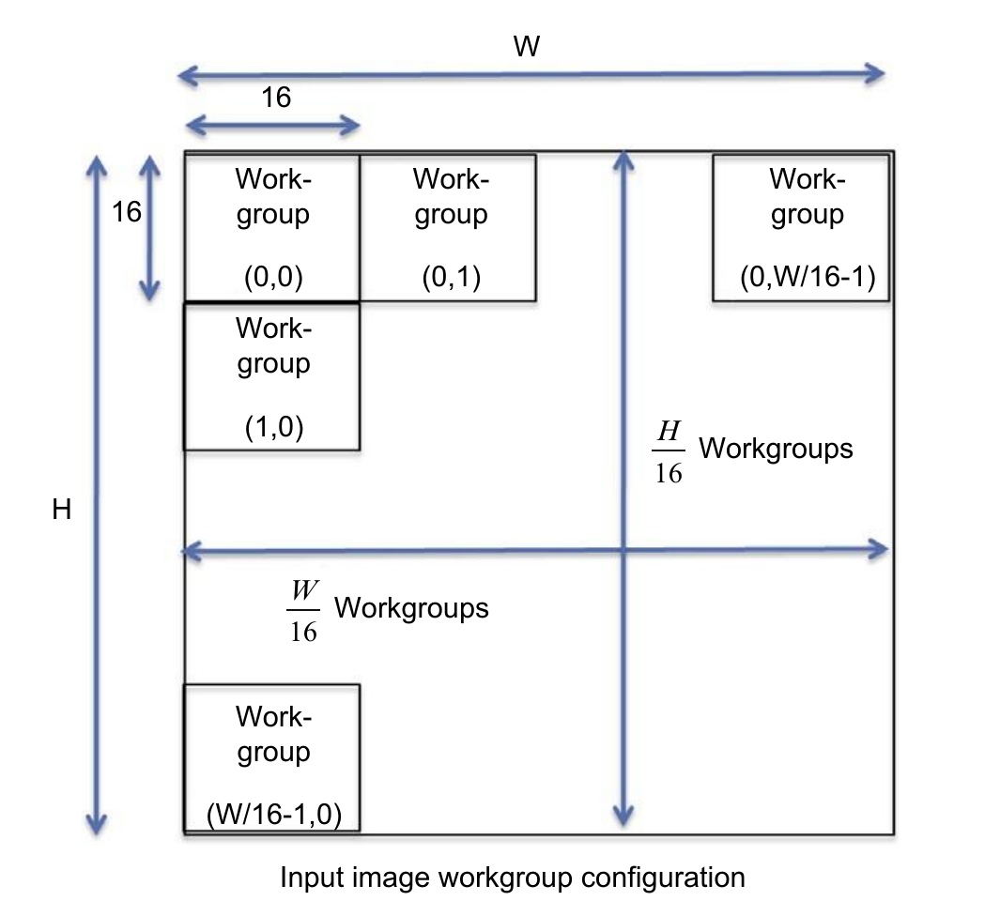

In [17]:
from IPython.display import Image
print "images from Heterogeneous Computing with OpenCL"
Image(filename='images/image_setup.png', width=400) 

In [70]:
import pyopencl.array as array

##### Create a queue and context ..

In [71]:
ctx = cl.create_some_context()
queue = cl.CommandQueue(ctx)

##### Load Image as numpy array

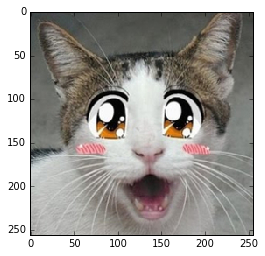

In [72]:
%matplotlib inline
from PIL import Image

im = Image.open('images/cat.jpg').convert('RGBA')
im = np.array(list(im.getdata())).astype(np.uint8).reshape((256, 256, 4))
plt.imshow(im, interpolation='nearest')

##### Create buffers for the image input and output

In [73]:
my_im = array.to_device(queue, im)
my_out = array.zeros_like(my_im)

In [75]:
my_im.data

##### Write the kernel following the rotation matrix

In [76]:
rotation_kernel = """
__kernel 
void img_rotate(__global float* dest_data, 
                __global float* src_data,    
                           int  w_image,    
                           int  h_image, 
                         float  sin_theta, 
                         float  cos_theta) { 

   //Work-item gets its index within index space
   int2 coord = (int2) (get_global_id(0), get_global_id(1));

   //Calculate location of data to move into (ix,iy) 
   float x0 = w_image/2.0f;
   float y0 = h_image/2.0f;

   float2 offset = (float2) (coord.x - x0, coord.y - y0);

   int xpos = (int)(offset.x*cos_theta + offset.y*sin_theta + x0 );
   int ypos = (int)(offset.y*cos_theta - offset.x*sin_theta + y0 ); 

   // Bounds Checking 
   if((xpos>=0) && (xpos< w_image) && (ypos>=0) && (ypos< h_image)) {
      dest_data[coord.y*w_image+coord.x] = src_data[ypos*w_image+xpos];    
   }
}
"""

##### Give the angle for the rotation ..

In [77]:
cos_theta = np.float32(np.cos(45))
sin_theta = np.float32(np.sin(45))

##### Compile your program!

In [78]:
program = cl.Program(ctx, rotation_kernel).build()

##### And run it!

In [79]:
launch = program.img_rotate(queue, my_im.shape, None, my_out.data, my_im.data, np.int32(256), np.int32(256), sin_theta, cos_theta)
launch.wait()

##### And you can retrive your data with the get method!!! ( pretty great right?!)

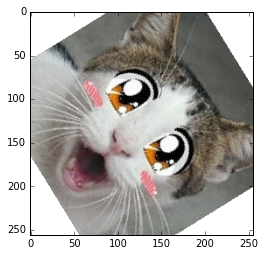

In [80]:
plt.imshow(my_out.get())

### Now let's try some blur ..

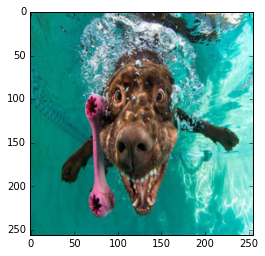

In [81]:
%matplotlib inline
from PIL import Image

im = Image.open('images/dog.png').convert('RGBA')
im = np.array(list(im.getdata())).astype(np.uint8).reshape((256, 256, 4))
plt.imshow(im)

In [82]:
print im

[[[  1 141 125 255]
  [  2 140 125 255]
  [  4 141 127 255]
  ..., 
  [152 250 237 255]
  [165 247 237 255]
  [170 248 246 255]]

 [[  5 142 127 255]
  [  3 141 126 255]
  [  2 140 125 255]
  ..., 
  [137 244 237 255]
  [165 249 244 255]
  [149 242 238 255]]

 [[ 12 144 131 255]
  [  5 142 127 255]
  [  1 141 125 255]
  ..., 
  [ 70 229 219 255]
  [149 249 246 255]
  [152 243 242 255]]

 ..., 
 [[  1 118 107 255]
  [  0 118 106 255]
  [  1 119 107 255]
  ..., 
  [105 229 234 255]
  [110 226 234 255]
  [ 94 232 230 255]]

 [[  1 116 105 255]
  [  1 117 106 255]
  [  0 119 107 255]
  ..., 
  [ 88 231 223 255]
  [102 229 225 255]
  [108 231 225 255]]

 [[  1 115 105 255]
  [  1 117 106 255]
  [  0 119 107 255]
  ..., 
  [ 90 230 221 255]
  [ 93 228 219 255]
  [112 230 224 255]]]


### Write the kernel... with image objects

In [83]:
blur_code = """
__kernel void gauss(__read_only image2d_t img,
                    __write_only image2d_t res,
                    __constant float * gaussian_kernel
                    ) {
    const sampler_t smp = CLK_NORMALIZED_COORDS_FALSE | CLK_FILTER_NEAREST | CLK_ADDRESS_CLAMP_TO_EDGE;
    int2 coord = (int2) (get_global_id(0), get_global_id(1));
    int2 img_size = (int2) (get_image_width(img), get_image_height(img));
    if (any(coord >= img_size)) {
        return;
    }
    
    float4 color = (float4) 0.0;
    int kernel_index = 0;
    for (int dx = -HALF_FILTER_SIZE; dx <= HALF_FILTER_SIZE; ++dx) {
        for (int dy = -HALF_FILTER_SIZE; dy <= HALF_FILTER_SIZE; ++dy, ++kernel_index) {
            color += read_imagef(img, smp, coord + (int2) (dx, dy)) * gaussian_kernel[kernel_index];
        }
    }
    write_imagef(res, coord, color);
}
"""

In OpenCL, samplers are objects that describe how to access an image. Samplers specify the type of coordinate system, what to do when out-of-bounds accesses occur, and whether or not to interpolate if an access lies between multiple indices.

array([[ 0.01940704,  0.01989833,  0.02019905,  0.0203003 ,  0.02019905,
         0.01989833,  0.01940704],
       [ 0.01989833,  0.02040206,  0.02071039,  0.02081421,  0.02071039,
         0.02040206,  0.01989833],
       [ 0.02019905,  0.02071039,  0.02102339,  0.02112877,  0.02102339,
         0.02071039,  0.02019905],
       [ 0.0203003 ,  0.02081421,  0.02112877,  0.02123468,  0.02112877,
         0.02081421,  0.0203003 ],
       [ 0.02019905,  0.02071039,  0.02102339,  0.02112877,  0.02102339,
         0.02071039,  0.02019905],
       [ 0.01989833,  0.02040206,  0.02071039,  0.02081421,  0.02071039,
         0.02040206,  0.01989833],
       [ 0.01940704,  0.01989833,  0.02019905,  0.0203003 ,  0.02019905,
         0.01989833,  0.01940704]], dtype=float32)

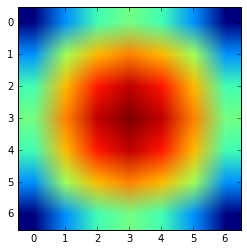

In [86]:
kernel_size = 7
sigma = 10.

def calc_gaussian_kernel(kernel_size=11, sigma=10.):
    kernel = np.zeros((kernel_size, kernel_size), np.float32)
    for x in range(kernel_size):
        for y in range(kernel_size):
            dx, dy = (x - kernel_size / 2), (y - kernel_size / 2)
            kernel[x, y] = np.exp(-dx**2/(2*sigma**2)-dy**2/(2*sigma**2))
    kernel /= np.sum(kernel)
    return kernel

gaussian_kernel = calc_gaussian_kernel(kernel_size, sigma)
plt.imshow(gaussian_kernel)
gaussian_kernel

#### Create Queue and Context

In [85]:
w, h = im.shape[:2][::-1]

ctx = cl.create_some_context()
queue = cl.CommandQueue(ctx)

#### Create buffers for I/O

In [89]:
cl_img_format = cl.ImageFormat(cl.channel_order.RGBA, cl.channel_type.UNORM_INT8)

mf = cl.mem_flags
img_input  = cl.Image(ctx, mf.READ_ONLY | mf.COPY_HOST_PTR, cl_img_format, (w, h), hostbuf=im)
img_output = cl.Image(ctx, mf.WRITE_ONLY, cl_img_format, (w, h))
buf_kernel = cl.Buffer(ctx, mf.READ_ONLY | mf.COPY_HOST_PTR, hostbuf=gaussian_kernel)

#### Compile Kernel with options

In [87]:
options = ['-D FILTER_SIZE={}'.format(kernel_size),
           '-D HALF_FILTER_SIZE={}'.format(kernel_size/2)]

program = cl.Program(ctx, blur_code).build(options)

#### Run the program

In [90]:
launch = program.gauss(queue, (w, h), (16, 16), img_input, img_output, buf_kernel)
launch.wait()

#### Read the results from the queue

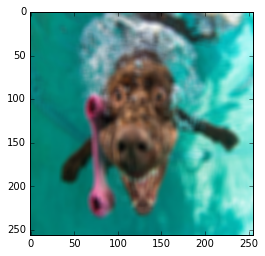

In [91]:
import matplotlib.pyplot as plt
result_img = np.zeros((h, w, 4), np.uint8)
cl.enqueue_copy(queue, result_img, img_output, origin=(0, 0, 0), region=(w, h, 1)).wait()
plt.imshow(result_img)

### Maybe a fractal...

In [92]:
mandelbrot_kernel = """__kernel void mandelbrot(__global char* i_buffer)
{
    int row = get_local_id(1) + get_local_size(1)*get_group_id(1);
    int col = get_local_id(0) + get_local_size(0)*get_group_id(0);
    int idx = row * 1024 + col;

    float x0 = ((float)col / 1024) * 3.5f - 2.5f;
    float y0 = ((float)row / 1024) * 3.5f - 1.75f;
    float x = 0.0f;
    float y = 0.0f;
    int iter = 0;
    float xtemp;
    while((x * x + y * y <= 4.0f) && (iter < idx))
    { 
        xtemp = x * x - y * y + x0;
        y = 2.0f * x * y + y0;
        x = xtemp;
        iter++;
    }

    int color = iter * 5;
    if (color >= 256) color = 0;
    i_buffer[idx] = color;
}
"""

In [93]:
ctx = cl.create_some_context()
queue = cl.CommandQueue(ctx)

In [94]:
program = cl.Program(ctx, mandelbrot_kernel).build()

In [95]:
out_fractal = array.zeros(queue, (1024, 1024), np.uint8)

In [96]:
out_fractal.data

In [97]:
run = program.mandelbrot(queue, out_fractal.shape, (16, 16), out_fractal.data).wait()

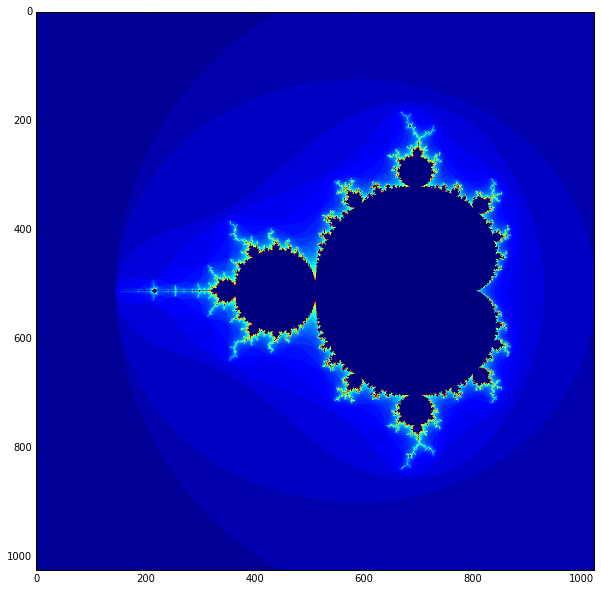

In [98]:
fig = plt.figure(figsize=(10, 10))
plt.imshow(out_fractal.get())

In [99]:
for work_group_size in [(16, 16), (4, 4), (1, 1), None]:
    %timeit program.mandelbrot(queue, out_fractal.shape, work_group_size, out_fractal.data).wait()

1 loop, best of 3: 1.68 s per loop
1 loop, best of 3: 3.12 s per loop


KeyboardInterrupt: 

## Generate Code with pyopencl kernels

In [100]:
a = array.arange(queue, 400, dtype=np.float32)
b = array.arange(queue, 400, dtype=np.float32)
c = array.empty_like(a)

my_kernel = cl.elementwise.ElementwiseKernel(ctx, "float a, float *x, float b, float *y, float *z",
"z[i] = a*x[i] + b*y[i]")
my_kernel(1, a, 2, b, c)
assert(c.get() == (1*a + 2*b).get()).all()

In [ ]:
user: scipy.2016 pass: SciPyla2016

In [101]:
c.get()

array([    0.,     3.,     6.,     9.,    12.,    15.,    18.,    21.,
          24.,    27.,    30.,    33.,    36.,    39.,    42.,    45.,
          48.,    51.,    54.,    57.,    60.,    63.,    66.,    69.,
          72.,    75.,    78.,    81.,    84.,    87.,    90.,    93.,
          96.,    99.,   102.,   105.,   108.,   111.,   114.,   117.,
         120.,   123.,   126.,   129.,   132.,   135.,   138.,   141.,
         144.,   147.,   150.,   153.,   156.,   159.,   162.,   165.,
         168.,   171.,   174.,   177.,   180.,   183.,   186.,   189.,
         192.,   195.,   198.,   201.,   204.,   207.,   210.,   213.,
         216.,   219.,   222.,   225.,   228.,   231.,   234.,   237.,
         240.,   243.,   246.,   249.,   252.,   255.,   258.,   261.,
         264.,   267.,   270.,   273.,   276.,   279.,   282.,   285.,
         288.,   291.,   294.,   297.,   300.,   303.,   306.,   309.,
         312.,   315.,   318.,   321.,   324.,   327.,   330.,   333.,
      

## Something nice if you're working over ipynb

In [102]:
%load_ext pyopencl.ipython_ext

In [103]:
%%cl_kernel -o "-cl-fast-relaxed-math"
__kernel void dob(__global const float *a, __global float *c)
{
  int gid = get_global_id(0);
  c[gid] = a[gid] + a[gid];
}

In [104]:
dob(queue, a.shape, None, a.data, c.data).wait()
assert(c.get() == (a + a).get()).all()

## Want to learn more?
[Andreas Klöckner's web page](https://mathema.tician.de/software/pyopencl/)

images from Heterogeneous Computing with OpenCL


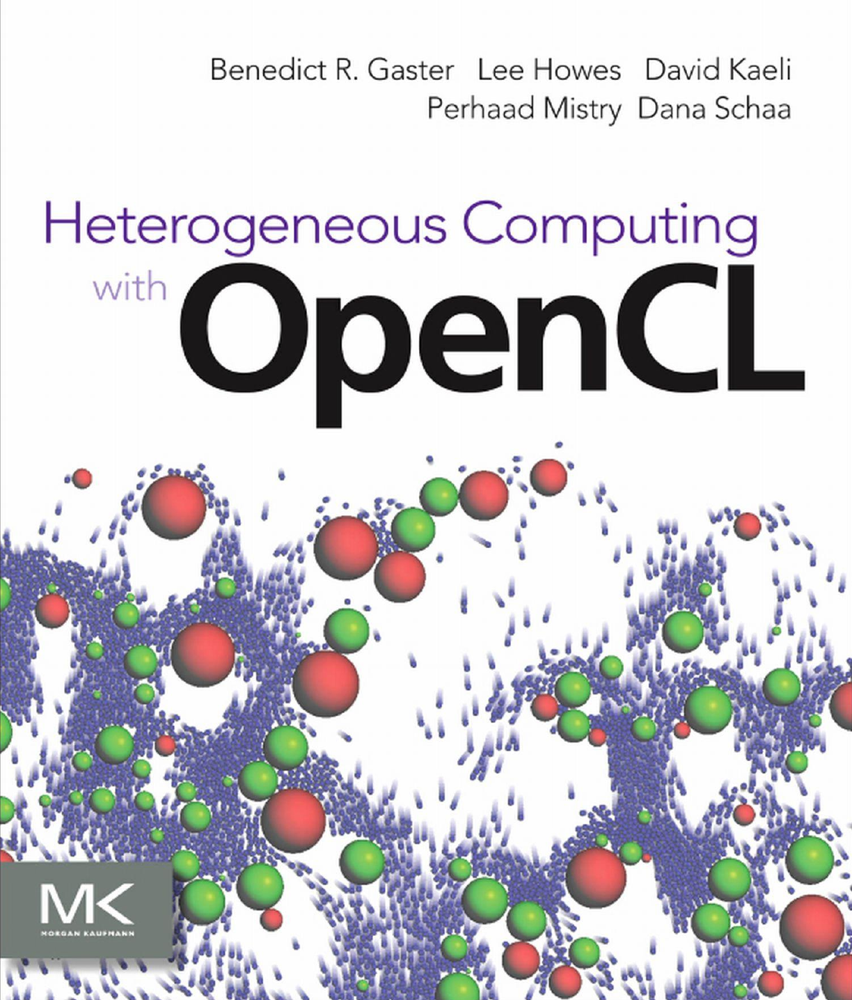

In [105]:
from IPython.display import Image
print "images from Heterogeneous Computing with OpenCL"
Image(filename='images/cover.png', width=400) 